The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[2024/10/13 01:06:31 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
100%|██████████| 17/17 [00:00<00:00, 41.88it/s]
[2024/10/13 01:06:31 hloc INFO] Finished exporting features.
[2024/10/13 01:06:31 hloc INFO] Found 136 pairs.
[2024/10/13 01:06:31 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
100%|██████████| 136/136 [00:01<00:00, 88.12it/s]
[2024/10/13 01:06:33 hloc INFO] Finished exporting matches.
[2024/10/13 01:06:33 hloc INFO] Creating an empty database...
[2024/10/13 01:06:33 hloc INFO] Importing images into the database...
[2024/10/13 01:06:33 hloc INFO] Importing features into the database...
100%|██████████| 17/17 [00:00<00:00, 3401.54it/s]
[2024/10/13 01:06:33 hloc INFO] Importing matches into the database...
100%|██████████| 136/136 [0

I20241013 01:06:40.260405 140433647973440 incremental_mapper.cc:375] Registering image #13 (5)
I20241013 01:06:40.260418 140433647973440 incremental_mapper.cc:378] => Image sees 2483 / 4868 points
I20241013 01:06:40.260666 140433647973440 incremental_mapper.cc:389] => Could not register, trying another image.
I20241013 01:06:40.260668 140433647973440 incremental_mapper.cc:375] Registering image #12 (5)
I20241013 01:06:40.260669 140433647973440 incremental_mapper.cc:378] => Image sees 2419 / 4924 points
I20241013 01:06:40.260939 140433647973440 incremental_mapper.cc:389] => Could not register, trying another image.
I20241013 01:06:40.260940 140433647973440 incremental_mapper.cc:375] Registering image #1 (5)
I20241013 01:06:40.260941 140433647973440 incremental_mapper.cc:378] => Image sees 2277 / 4889 points
I20241013 01:06:40.261158 140433647973440 incremental_mapper.cc:389] => Could not register, trying another image.
I20241013 01:06:40.261159 140433647973440 incremental_mapper.cc:375]

found 49/113 inlier correspondences.


100%|██████████| 1/1 [00:00<00:00, 11.58it/s]
[2024/10/13 01:07:07 hloc INFO] Finished exporting features.
[2024/10/13 01:07:07 hloc INFO] Found 17 pairs.
[2024/10/13 01:07:07 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
100%|██████████| 17/17 [00:00<00:00, 51.06it/s]
[2024/10/13 01:07:08 hloc INFO] Finished exporting matches.
[2024/10/13 01:07:08 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


found 12/191 inlier correspondences.


100%|██████████| 1/1 [00:00<00:00, 11.67it/s]
[2024/10/13 01:07:08 hloc INFO] Finished exporting features.
[2024/10/13 01:07:08 hloc INFO] Found 17 pairs.
[2024/10/13 01:07:08 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
100%|██████████| 17/17 [00:00<00:00, 39.24it/s]
[2024/10/13 01:07:09 hloc INFO] Finished exporting matches.
[2024/10/13 01:07:09 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


found 22/201 inlier correspondences.


100%|██████████| 1/1 [00:00<00:00, 13.23it/s]
[2024/10/13 01:07:09 hloc INFO] Finished exporting features.
[2024/10/13 01:07:09 hloc INFO] Found 17 pairs.
[2024/10/13 01:07:09 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
100%|██████████| 17/17 [00:00<00:00, 37.49it/s]
[2024/10/13 01:07:10 hloc INFO] Finished exporting matches.


found 1932/2050 inlier correspondences.


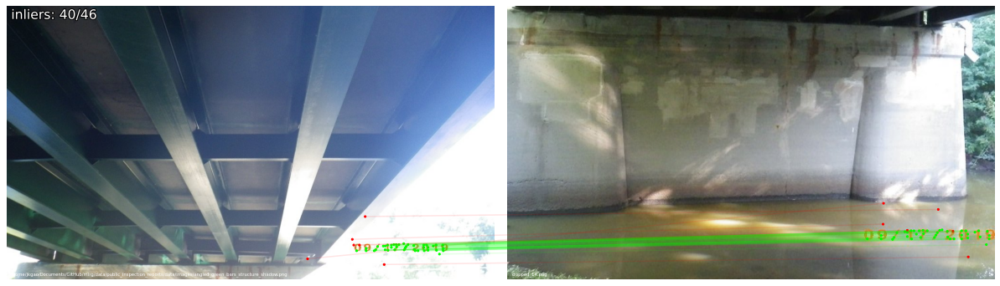

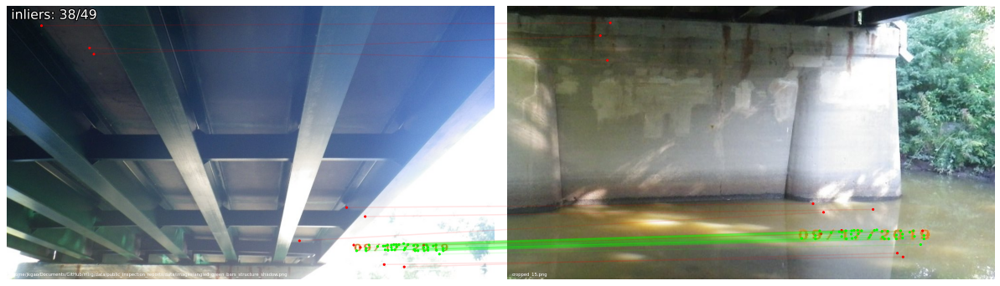

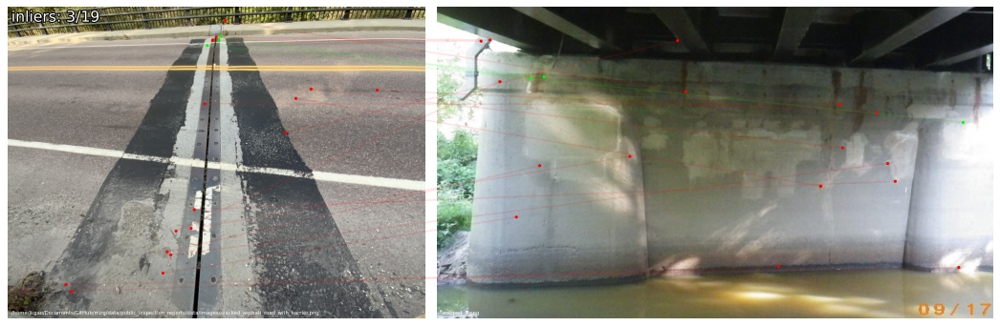

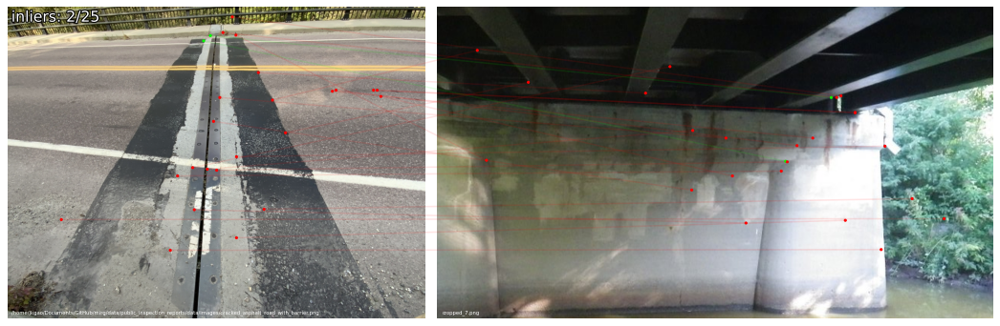

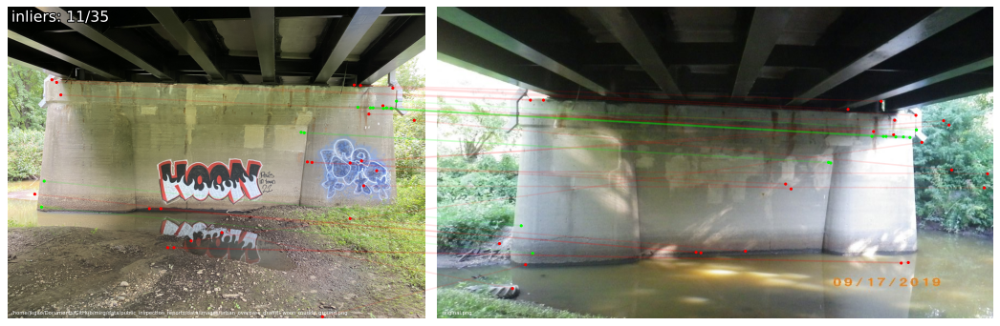

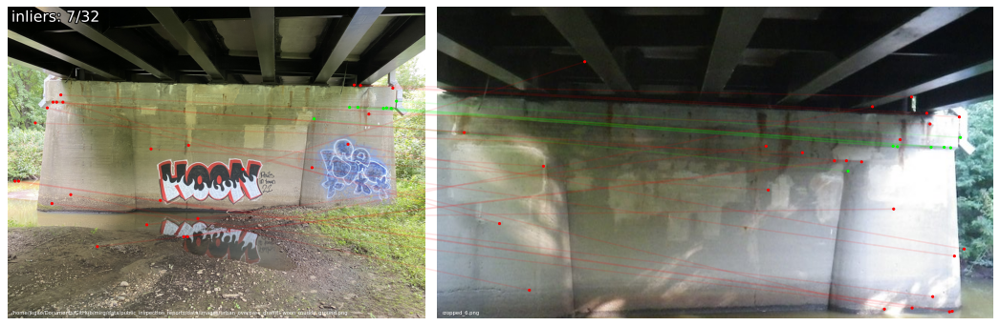

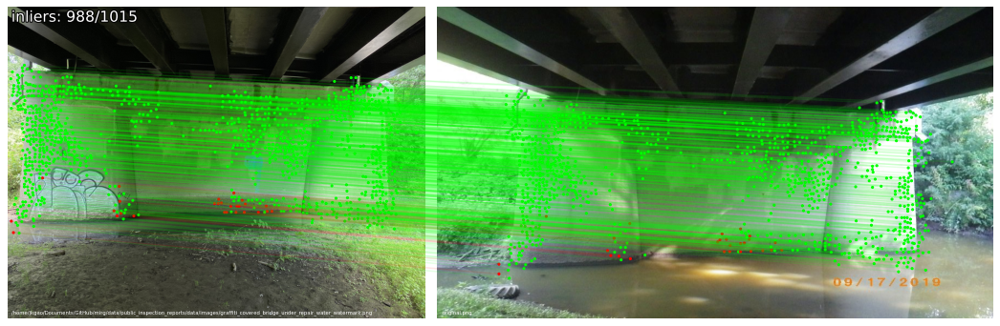

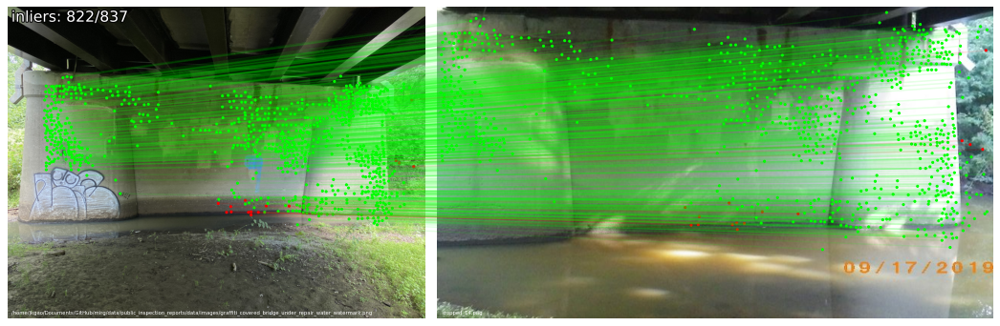

In [18]:
%load_ext autoreload
%autoreload 2
from models.hloc import Hloc
import json

hloc = Hloc()
with open(
    "/home/jkgao/Documents/GitHub/mirg/data/public_inspection_reports/data/200030002008022/viewreport.ashx-3/images/metadata.json",
    "r",
) as f:
    metadata = json.load(f)

# image_path = "/home/jkgao/Documents/GitHub/mirg/data/public_inspection_reports/data/input/VT15-00020-CAMBRIDGE/images/road_dashed_line_vanishing_point_perspective.png"
image_path = "/home/jkgao/Documents/GitHub/mirg/data/public_inspection_reports/data/input/VT15-00020-CAMBRIDGE/images/concrete_bridge_underpass_waterway.png"
image_dir = "/home/jkgao/Documents/GitHub/mirg/data/public_inspection_reports/data/images"

matches3, logs, model = hloc.is_same_location(
    image=image_path,
    image_dir=image_dir,
    min_inliers=100,
);

In [19]:
import numpy as np

def get_inlier_data(
    loc,
    reconstruction=None,
):
    if loc.get("covisibility_clustering", False):
        # select the first, largest cluster if the localization failed
        loc = loc["log_clusters"][loc["best_cluster"] or 0]

    inliers = np.array(loc["PnP_ret"]["inliers"])
    mkp_q = loc["keypoints_query"]
    n = len(loc["db"])

    kp_idxs, kp_to_3D_to_db = loc["keypoint_index_to_db"]
    counts = np.zeros(n)
    dbs_kp_q_db = [[] for _ in range(n)]
    inliers_dbs = [[] for _ in range(n)]
    for i, (inl, (p3D_id, db_idxs)) in enumerate(zip(inliers, kp_to_3D_to_db)):
        track = reconstruction.points3D[p3D_id].track
        track = {el.image_id: el.point2D_idx for el in track.elements}
        for db_idx in db_idxs:
            counts[db_idx] += inl
            kp_db = track[loc["db"][db_idx]]
            dbs_kp_q_db[db_idx].append((i, kp_db))
            inliers_dbs[db_idx].append(inl)

    db_sort = np.argsort(-counts)
    db_idx = db_sort[0]
    db_kp_q_db = np.array(dbs_kp_q_db[db_idx])
    kp_q = mkp_q[db_kp_q_db[:, 0]]
    kp_db = np.array([reconstruction.images[loc["db"][db_idx]].points2D[i].xy for i in db_kp_q_db[:, 1]])

    db_image_name = reconstruction.images[loc["db"][db_idx]].name

    return kp_db, kp_q, inliers, db_image_name

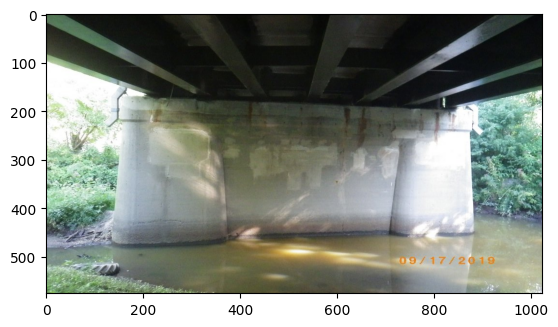

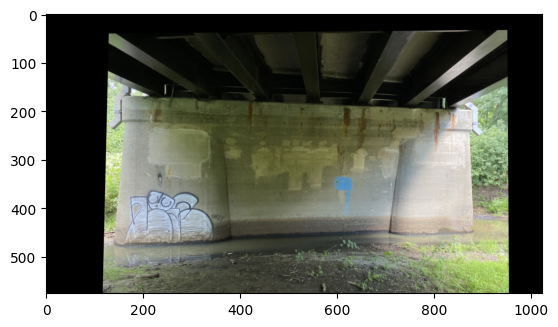

In [22]:
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np

# Load the image
for i,name in enumerate(os.listdir(image_dir)):
    if not name.endswith('.png'):
        continue

    kp_db, kp_q, inliers, db_image_name = get_inlier_data(logs[i], model)

    num_inliers = sum(inliers)
    if num_inliers < 100:
        continue


    query = os.path.join(image_dir, name)
    query_image = Image.open(query)
    db_image = Image.open("outputs/hloc/images/" + db_image_name)

    H, status = cv2.findHomography(kp_q, kp_db, cv2.RANSAC)
    warped_query_image = cv2.warpPerspective(np.array(query_image), H, (np.array(db_image).shape[1], np.array(db_image).shape[0]))
    warped_query_image = Image.fromarray(warped_query_image)

    plt.imshow(db_image)
    plt.show()

    plt.imshow(warped_query_image)
    plt.show()

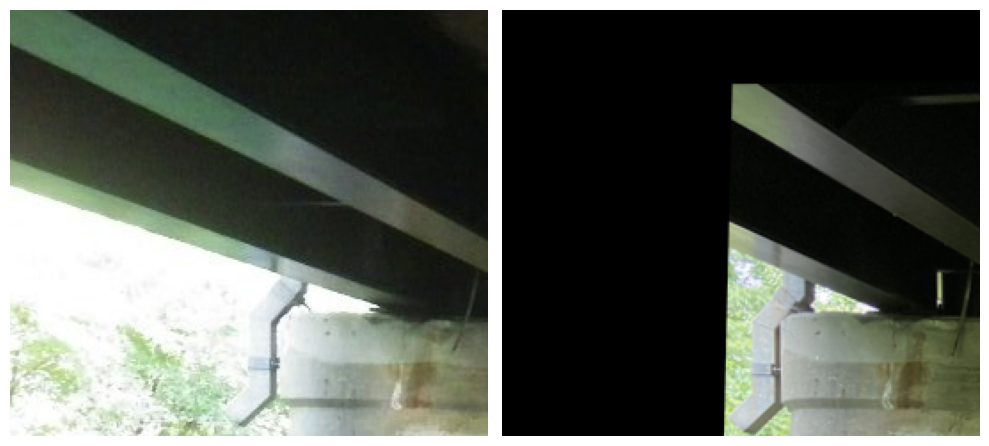

The lighting has changed. It appears the first image was taken at a time with more direct sunlight, while the second image was taken with a cloudy or overcast sky.


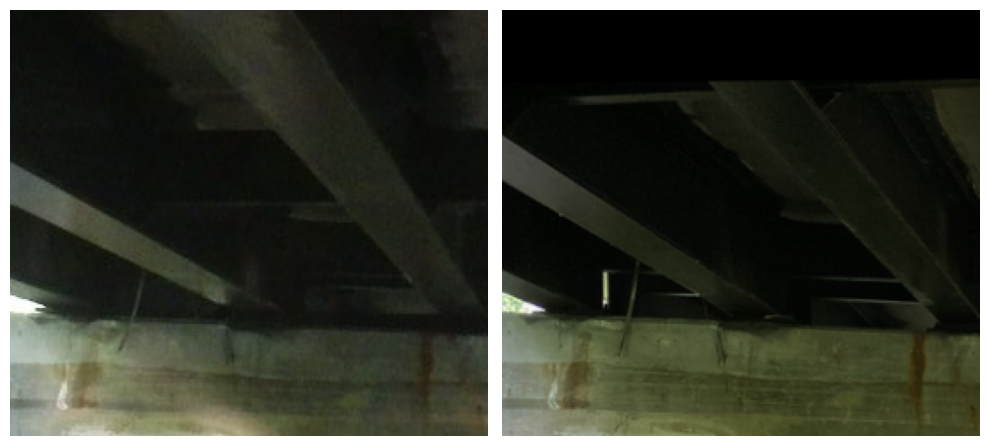

The lighting has changed. In the first image, the lighting is brighter and there is more detail. In the second image, the lighting is dimmer and there is less detail.


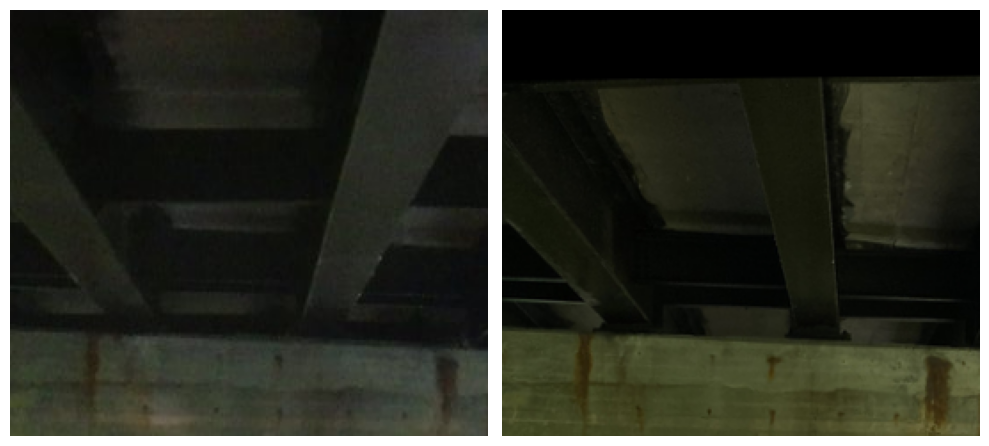

The lighting has improved in the second image.


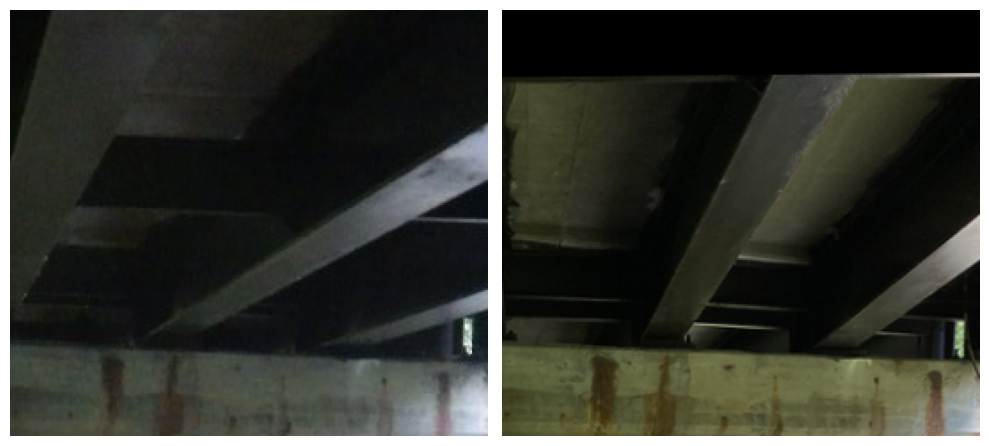

The lighting in the second image is brighter than the first image.


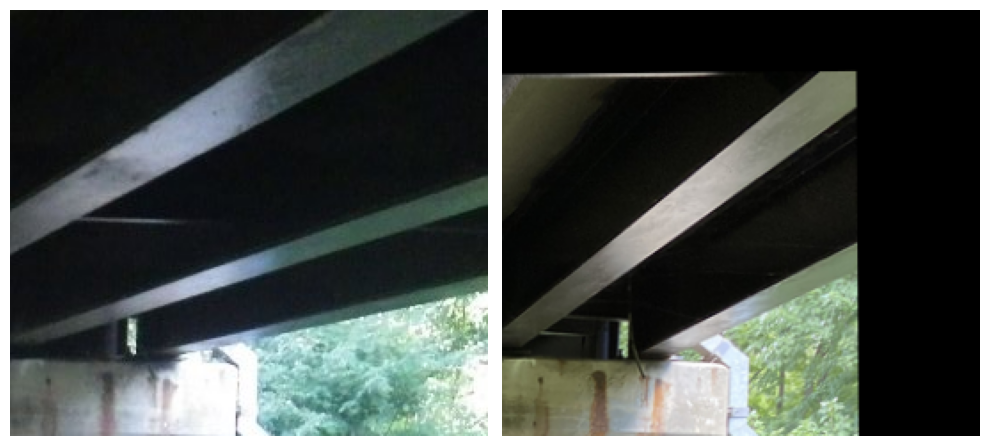

The first image is darker. The lighting in the second image is brighter.


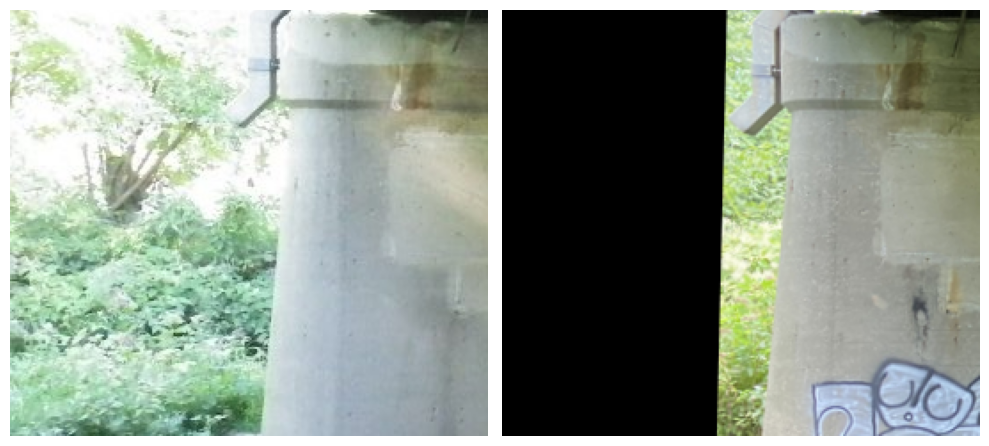

There is graffiti on the pillar in the second image.


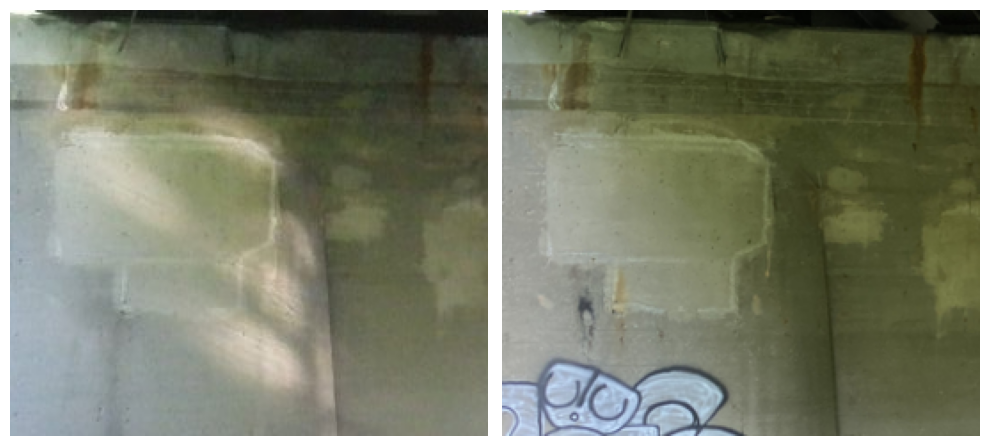

Graffiti has been added to the bottom of the second image.  The graffiti appears to be grey and is in the shape of a simple face.  The face has two large eyes, a small mouth and a small nose.


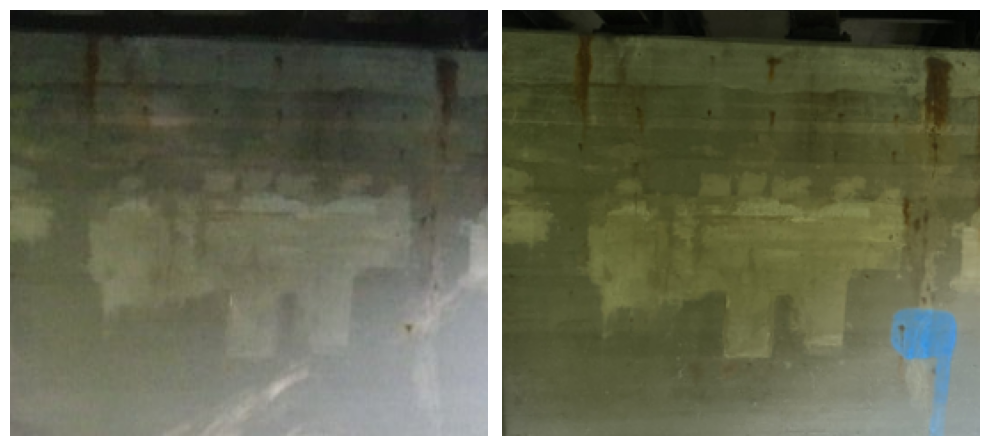

There is now a blue paint splatter in the bottom right of the second image.


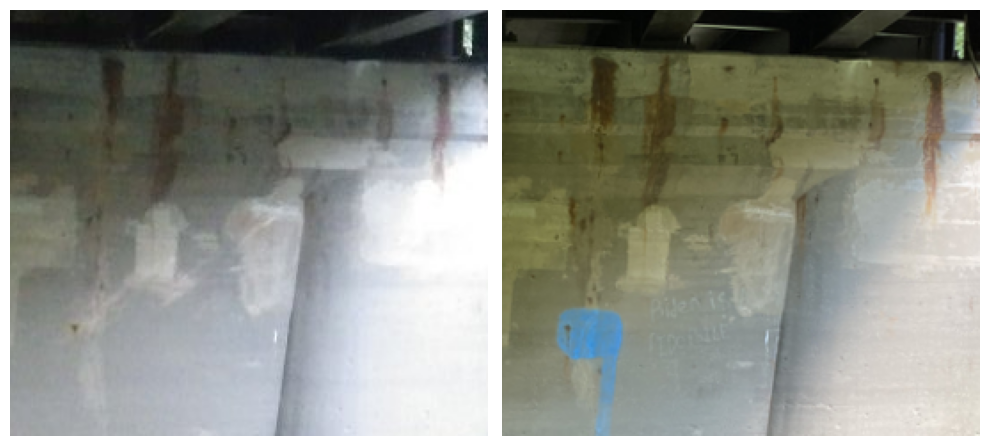

A blue marking has appeared on the wall.


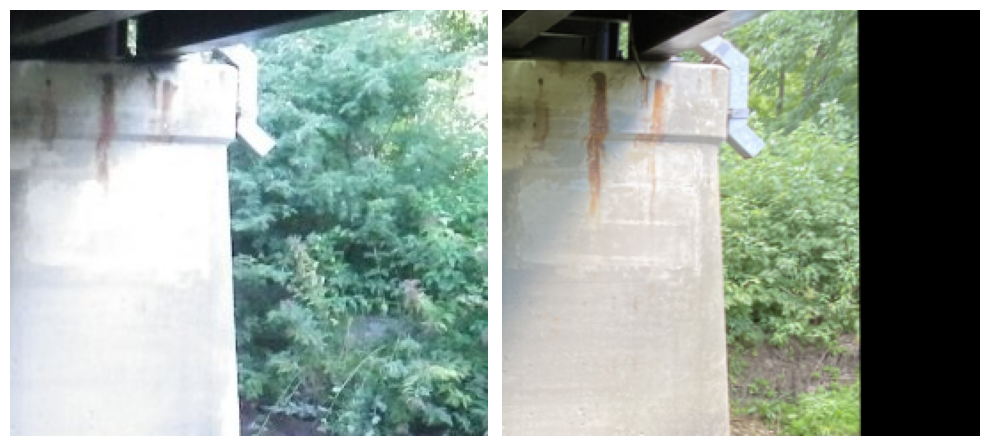

The metal piece that appears to be attached to the concrete post has moved slightly.  It is now at a more horizontal angle than it was in the first picture.


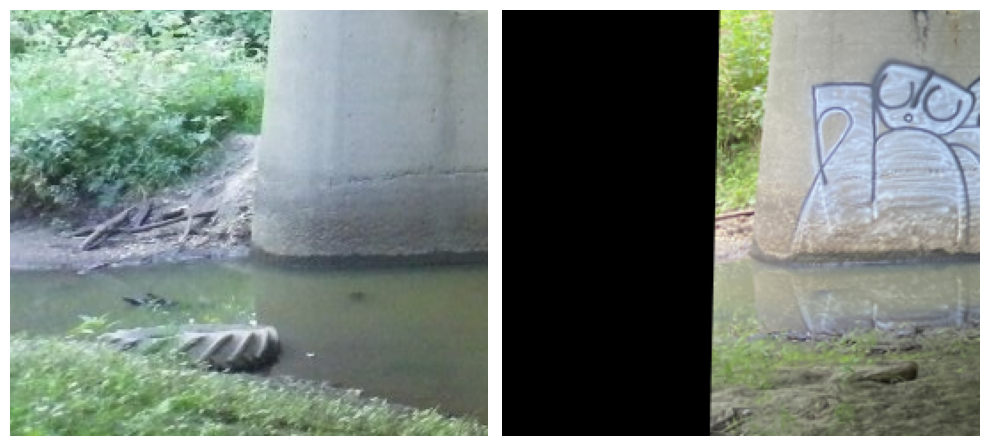

The tire is gone.


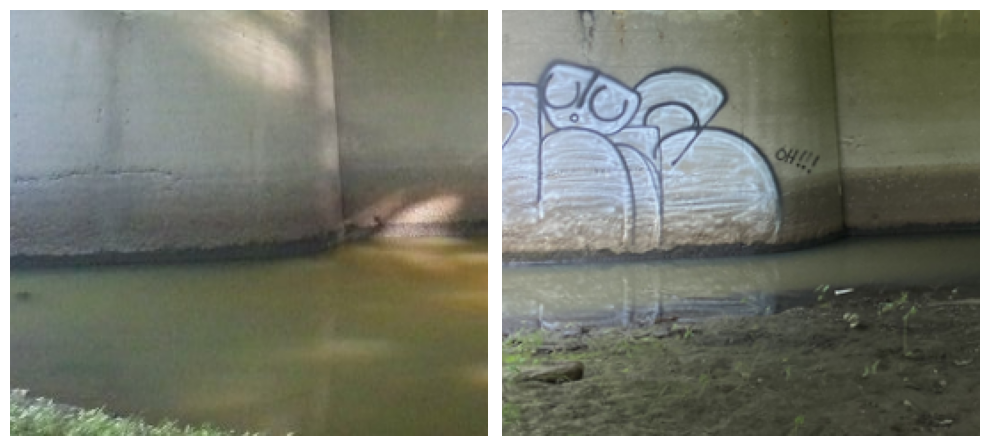

Graffiti has been added to the concrete under the bridge. It is of an abstract shape with an exclamation point written nearby.


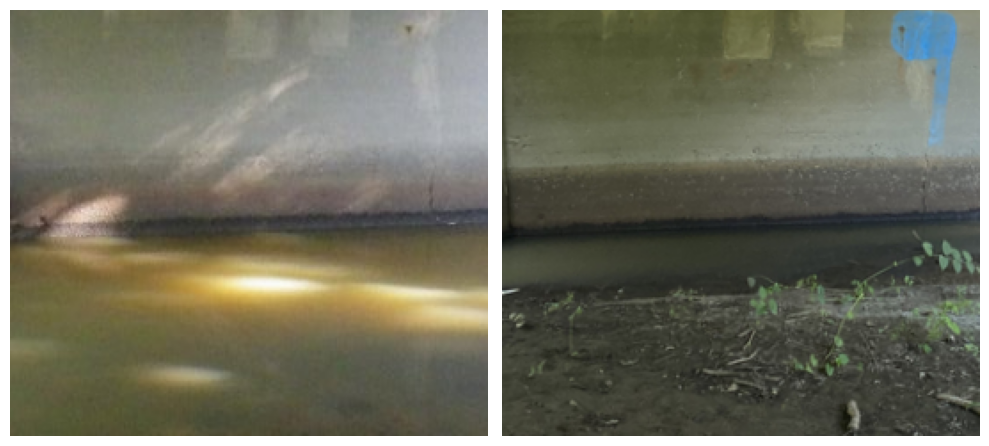

The water level in the river has gone down. It's clear in the second image that the river is much shallower than in the first picture.


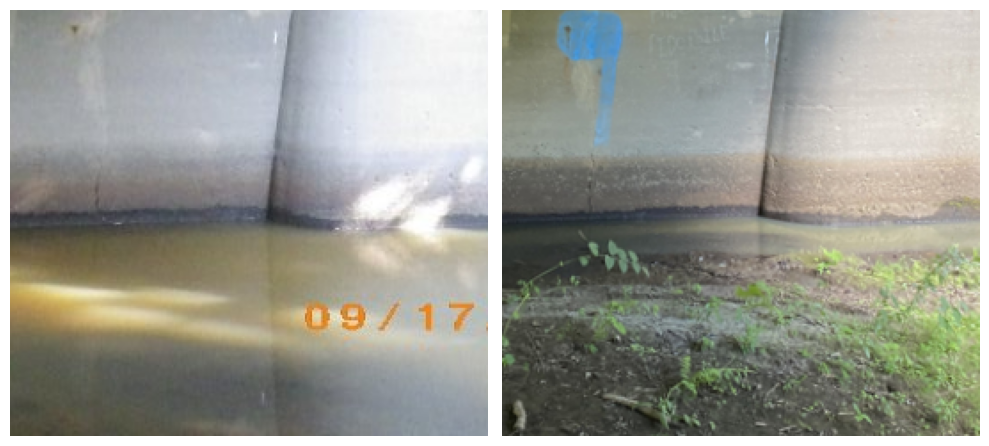

The water level has decreased between the two images.


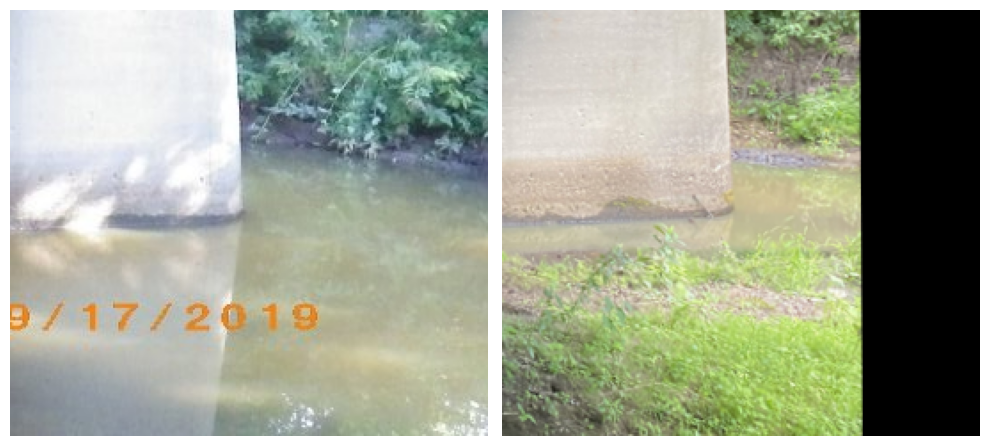

The water level has gone down.


In [23]:
from models.gemini import Gemini
from utils.media.image import get_overlapping_crops

gemini = Gemini()


db_crops = get_overlapping_crops(db_image, (5, 3), overlap=0.3)
q_crops = get_overlapping_crops(warped_query_image, (5, 3), overlap=0.3)

changes = []
for db_crop, q_crop in zip(db_crops, q_crops):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns
    axes[0].imshow(db_crop)
    axes[0].axis('off')  # Turn off axis
    axes[1].imshow(q_crop)
    axes[1].axis('off')  # Turn off axis
    plt.tight_layout()
    plt.show()

    # change = gemini.query([db_crop, q_crop, "Is there any new damage between the two images like exposed rebar, spalding, or cracks, etc?"])
    change = gemini.query([db_crop, q_crop, "What has changed between these two images?"])
    print(change)
    changes.append(change)
